In [1]:
import sys
sys.path.append(['/Users/joshbriegal/GitHub/GACF/example/'])
sys.path.append(['/Users/joshbriegal/GitHub/ngtsio/'])
from NGTS_Field import return_field_from_json_str, Field

NGTS_Field.py:9: UserWarning: ngtsio not imported
  warnings.warn("ngtsio not imported")
GACF_utils/ngtsio_utils.py:7: UserWarning: ngtsio not imported
  warnings.warn("ngtsio not imported")


In [2]:
# Import whole field
with open('NG2331-3922/field.json', 'r') as f:
        field = return_field_from_json_str(f.read())

{u'peak_indexes': array([11]), u'lag_resolution': None, u'correlations': array([ 1.        ,  0.84946045,  0.91126478, ..., -0.00464769,
       -0.00464769,  0.        ]), u'timeseries_binned': array([ 854.37087303,  854.38466263,  854.39855817, ..., 1106.03747303,
       1106.05135106, 1106.05954453]), u'peak_signal_to_noise': array([1.91478224]), u'weight_function': u'gaussian', u'flux_binned_std_dev': 0.06852073348591306, u'lc_data2get': array([u'HJD', u'SYSREM_FLUX3', u'FLAGS'], dtype='<U12'), u'flux_binned': array([1.9291152 , 1.93687115, 1.99056049, ..., 1.03882073, 0.94077109,
       0.93652227]), u'selection_function': u'natural', u'gen_ft_dict': {u'max': array([22.51860589, 22.7701695 , 24.00865284, ...,  1.89098452,
        2.12345846,  2.42781194]), u'median': array([1.92347664, 2.85783696, 3.5862335 , ..., 1.00001417, 0.97588871,
       0.92666333]), u'periods': array([           inf, 5.03581885e+02, 2.51790942e+02, ...,
       2.04708083e-01, 2.04624902e-01, 2.04541789e-01

In [3]:
# Reduce number of objects in field
# for i, obj in enumerate(field):
#     if i%100 != 0:
#         field.objects[i] = None

In [4]:
import matplotlib.pyplot as plt
import numpy as np

In [5]:
# Generate list of objects to view
obj_ids_idxed = [(i, int(obj.obj)) for i, obj in enumerate(field)]
obj_ids = [o for _, o in obj_ids_idxed]
rand_below = np.random.randint(low=min(obj_ids), high=4000, size=3)
rand_above = np.random.randint(low=4000, high=max(obj_ids), size=3)
obj_ids_to_print = []

for i, v in enumerate(rand_below):
    obj_ids_to_print.append(obj_ids_idxed[np.abs(obj_ids-v).argmin()])
for i, v in enumerate(rand_above):
    obj_ids_to_print.append(obj_ids_idxed[np.abs(obj_ids-v).argmin()])
    
obj_ids_to_print = sorted(obj_ids_to_print, key=lambda x: x[1])
obj_ids = [o for _, o in obj_ids_to_print]
print "Object IDs {}".format(obj_ids)

Object IDs [310, 1026, 2805, 9786, 14838, 24150]


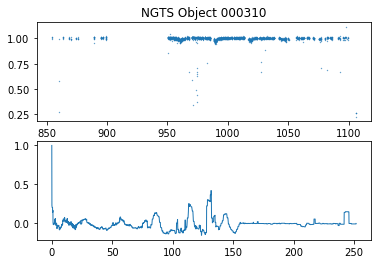

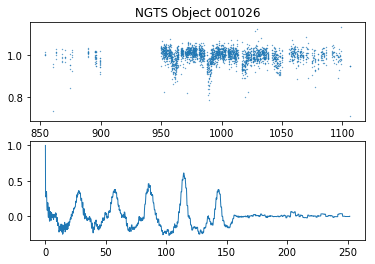

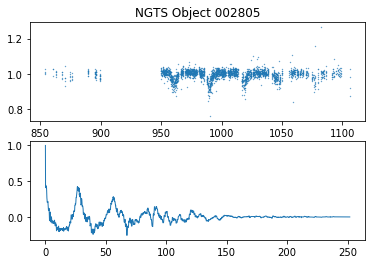

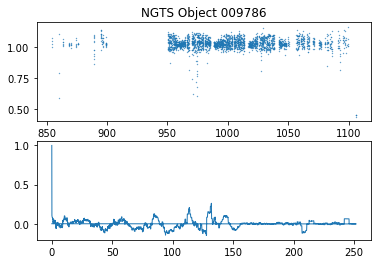

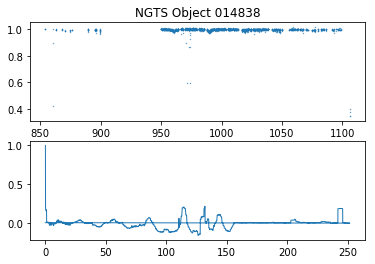

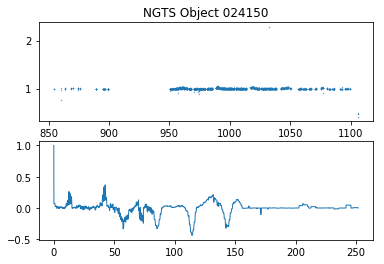

In [6]:
for i, obj_id in obj_ids_to_print:
        fig, (ax1, ax2) = plt.subplots(2, 1)
        ax1.scatter(field[i].timeseries_binned, field[i].flux_binned, s=0.1)
        ax1.set_title("NGTS Object {}".format(field[i].obj))
        ax2.plot(field[i].lag_timeseries,field[i].correlations, lw=1)
        plt.show()

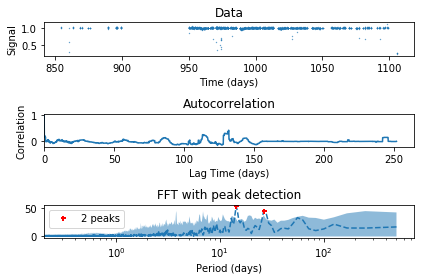

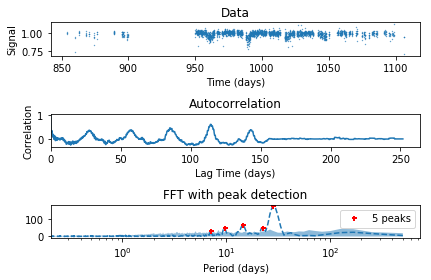

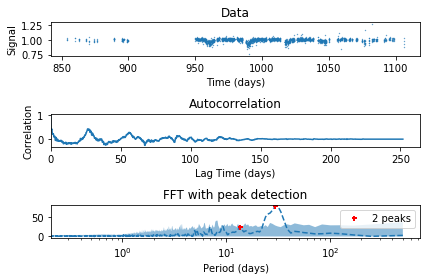

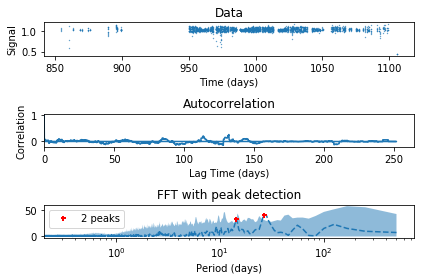

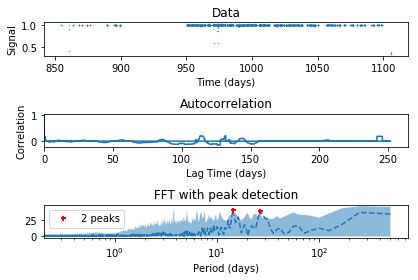

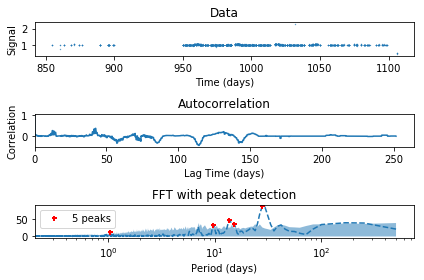

In [7]:
for i, obj_id in obj_ids_to_print:
    field[i].plot_data_autocol_ft(interactive=True)

In [16]:
obj = field[3310]
obj.filename = os.getcwd()
obj.calculate_autocorrelation()
obj.calculate_noise_threshold()
obj.calculate_periods_from_autocorrelation()


Calculating correlations: 100%|█████████▉| 2471/2472.0 [00:01<00:00, 1589.50it/s]
Calculating correlations: 100%|█████████▉| 2471/2472.0 [01:15<00:00, 32.75it/s]
Calculating Noise Fourier Transforms: 100%|██████████| 998/998 [00:01<00:00, 930.08it/s]


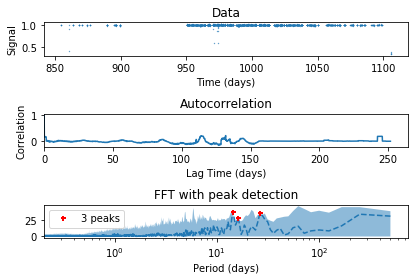

In [45]:
obj.plot_data_autocol_ft(interactive=True)

In [48]:
obj.logger = None

In [49]:
from copy import deepcopy
obj2 = deepcopy(obj)

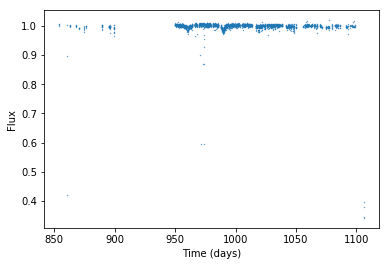

In [51]:
obj2.plot_data(interactive=True)

In [52]:
from scipy.stats import sigmaclip

In [64]:
_, lower, upper = sigmaclip(obj2.flux_binned)
flux_clip_idx = (obj2.flux_binned > lower) & (obj2.flux_binned < upper)
print flux_clip_idx

[ True  True  True ... False False False]


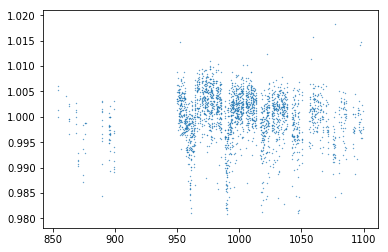

In [67]:
plt.scatter(obj2.timeseries_binned[flux_clip_idx], obj2.flux_binned[flux_clip_idx], s=0.1)
plt.show()

In [68]:
obj2.correlations = None
obj2.lag_timeseries = None
obj2.running_noise_threshold = None
obj2.timeseries_binned = obj2.timeseries_binned[flux_clip_idx]
obj2.flux_binned = obj2.flux_binned[flux_clip_idx]
obj2.flux_binned_err = obj2.flux_binned_err[flux_clip_idx]

Calculating correlations: 100%|██████████| 2426/2426.0 [00:01<00:00, 1767.21it/s]
Calculating correlations: 100%|██████████| 2426/2426.0 [01:08<00:00, 35.57it/s]
Calculating Noise Fourier Transforms: 100%|██████████| 998/998 [00:04<00:00, 238.18it/s]


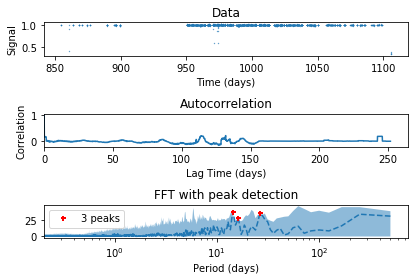

In [74]:
obj2.calculate_autocorrelation()
obj2.calculate_noise_threshold()
obj2.calculate_periods_from_autocorrelation()


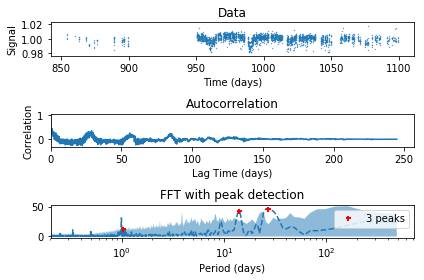

In [75]:
obj2.plot_data_autocol_ft(interactive=True)

In [77]:
len(field.objects)

3433

In [78]:
obj2

NGTS Object NG2331-3922_014838 (CYCLE1706)

In [79]:
obj_ids_to_print

[(1620, 310),
 (3282, 1026),
 (227, 2805),
 (3340, 9786),
 (3310, 14838),
 (873, 24150)]

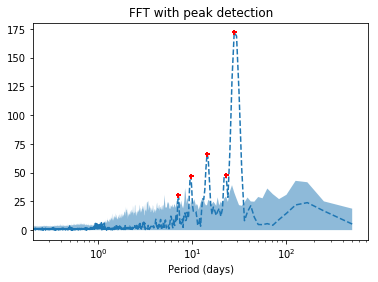

In [80]:
field[3282].plot_ft(interactive=True)

In [82]:
1 / field[3282].periods

array([0.03574401, 0.06950225, 0.10326049, 0.04368713, 0.14099028])

In [83]:
field[3282].periods

array([27.97671173, 14.38802317,  9.68424637, 22.89003687,  7.09268748])

In [85]:
# Find a string of the same period objects (e.g. 4320-4450)
omin = 4320
omax = 4450
same_objs = []
for i, obj in enumerate(field):
    if int(obj.obj) < omax and int(obj.obj) > omin: 
        same_objs.append(i)

In [86]:
field[same_objs]

array([NGTS Object NG2331-3922_004432 (CYCLE1706),
       NGTS Object NG2331-3922_004370 (CYCLE1706),
       NGTS Object NG2331-3922_004368 (CYCLE1706),
       NGTS Object NG2331-3922_004349 (CYCLE1706),
       NGTS Object NG2331-3922_004433 (CYCLE1706),
       NGTS Object NG2331-3922_004443 (CYCLE1706),
       NGTS Object NG2331-3922_004383 (CYCLE1706),
       NGTS Object NG2331-3922_004379 (CYCLE1706),
       NGTS Object NG2331-3922_004393 (CYCLE1706),
       NGTS Object NG2331-3922_004430 (CYCLE1706),
       NGTS Object NG2331-3922_004380 (CYCLE1706),
       NGTS Object NG2331-3922_004440 (CYCLE1706),
       NGTS Object NG2331-3922_004340 (CYCLE1706),
       NGTS Object NG2331-3922_004373 (CYCLE1706),
       NGTS Object NG2331-3922_004347 (CYCLE1706),
       NGTS Object NG2331-3922_004352 (CYCLE1706),
       NGTS Object NG2331-3922_004424 (CYCLE1706),
       NGTS Object NG2331-3922_004392 (CYCLE1706),
       NGTS Object NG2331-3922_004399 (CYCLE1706),
       NGTS Object NG2331-3922_

In [89]:
for i, obj in enumerate(field[same_objs]):
    if obj.periods == []:
        same_objs[i] = None
    else:
        print "{}: (Period, S2N): {}".format(obj, zip(obj.periods, obj.peak_signal_to_noise))

NGTS Object NG2331-3922_004432 (CYCLE1706): (Period, S2N): []
NGTS Object NG2331-3922_004370 (CYCLE1706): (Period, S2N): [(27.976714377828714, 7.295410569967976), (14.388024537169052, 4.4413980485896785), (9.501525637753149, 1.2085990602983794), (21.89481994786595, 1.0607681509763545), (38.73698913853206, 1.0004122505650193)]
NGTS Object NG2331-3922_004368 (CYCLE1706): (Period, S2N): [(27.976714377828714, 7.295410569967976), (14.388024537169052, 4.4413980485896785), (9.501525637753149, 1.2085990602983794), (21.89481994786595, 1.0607681509763545), (38.73698913853206, 1.0004122505650193)]
NGTS Object NG2331-3922_004349 (CYCLE1706): (Period, S2N): [(27.976714377828714, 7.295410569967976), (14.388024537169052, 4.4413980485896785), (9.501525637753149, 1.2085990602983794), (21.89481994786595, 1.0607681509763545), (38.73698913853206, 1.0004122505650193)]
NGTS Object NG2331-3922_004433 (CYCLE1706): (Period, S2N): []
NGTS Object NG2331-3922_004443 (CYCLE1706): (Period, S2N): []
NGTS Object NG23

/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:2: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  from ipykernel import kernelapp as app
/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:2: DeprecationWarning: elementwise == comparison failed; this will raise an error in the future.
  from ipykernel import kernelapp as app


NGTS Object NG2331-3922_004432 (CYCLE1706)
Not run for NGTS Object NG2331-3922_004432 (CYCLE1706)
NGTS Object NG2331-3922_004370 (CYCLE1706)


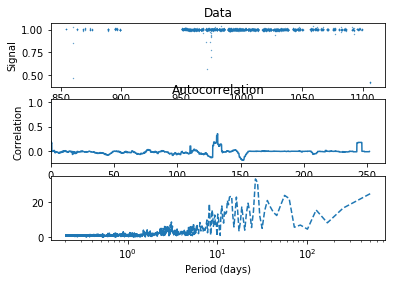

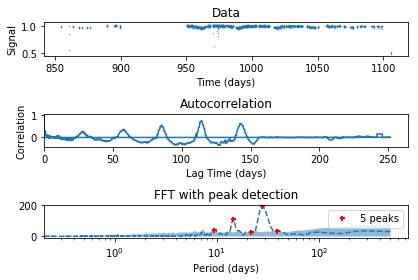

NGTS Object NG2331-3922_004368 (CYCLE1706)


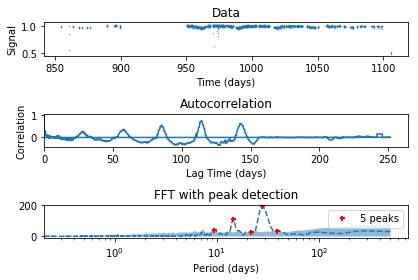

NGTS Object NG2331-3922_004349 (CYCLE1706)


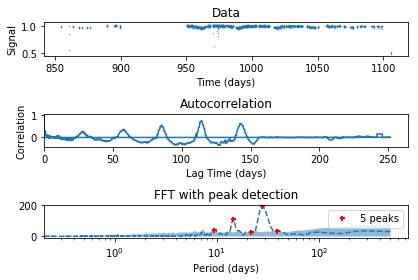

NGTS Object NG2331-3922_004433 (CYCLE1706)
Not run for NGTS Object NG2331-3922_004433 (CYCLE1706)
NGTS Object NG2331-3922_004443 (CYCLE1706)
Not run for NGTS Object NG2331-3922_004443 (CYCLE1706)
NGTS Object NG2331-3922_004383 (CYCLE1706)


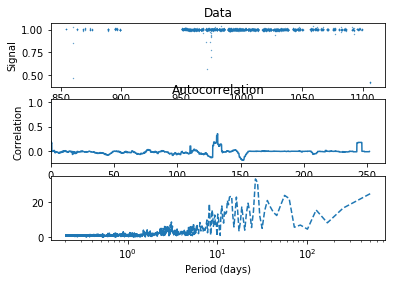

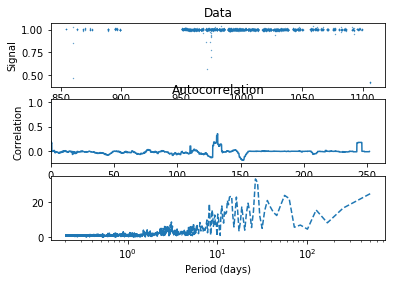

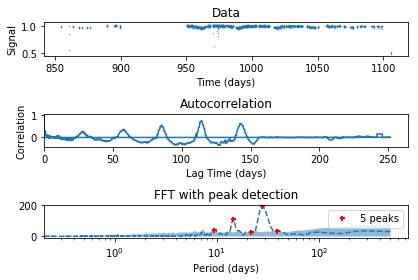

NGTS Object NG2331-3922_004379 (CYCLE1706)


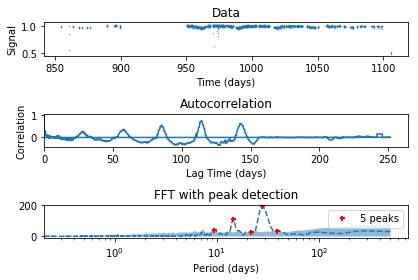

NGTS Object NG2331-3922_004393 (CYCLE1706)


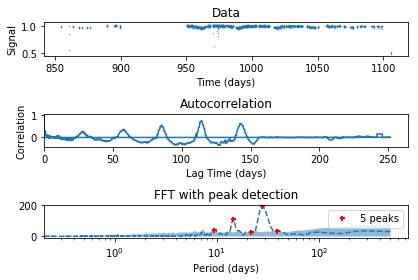

NGTS Object NG2331-3922_004430 (CYCLE1706)


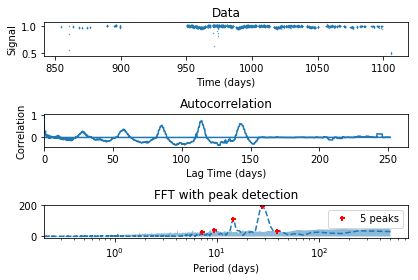

NGTS Object NG2331-3922_004380 (CYCLE1706)


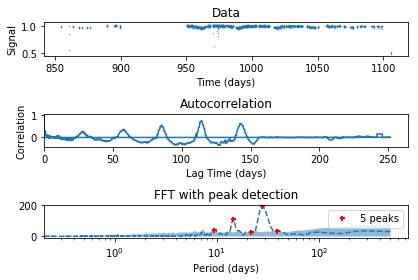

NGTS Object NG2331-3922_004440 (CYCLE1706)
Not run for NGTS Object NG2331-3922_004440 (CYCLE1706)
NGTS Object NG2331-3922_004340 (CYCLE1706)


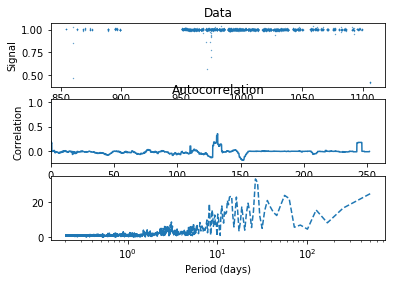

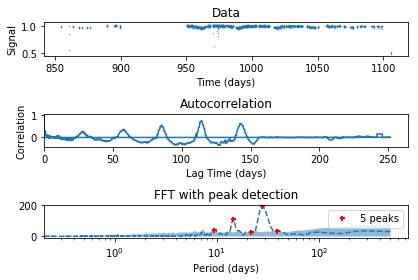

NGTS Object NG2331-3922_004373 (CYCLE1706)


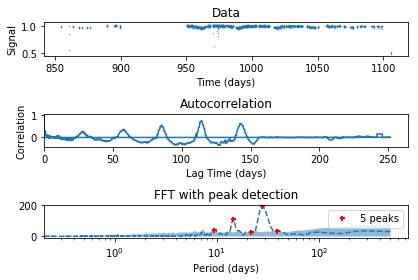

NGTS Object NG2331-3922_004347 (CYCLE1706)


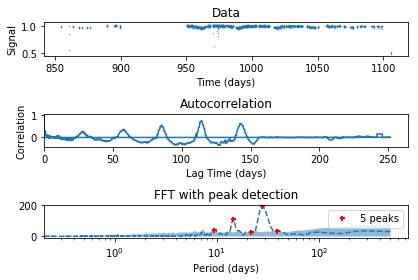

NGTS Object NG2331-3922_004352 (CYCLE1706)


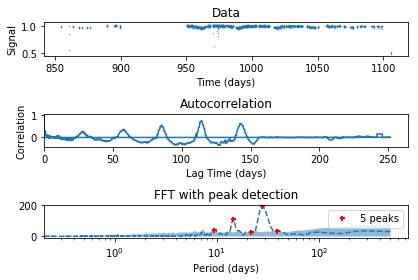

NGTS Object NG2331-3922_004424 (CYCLE1706)


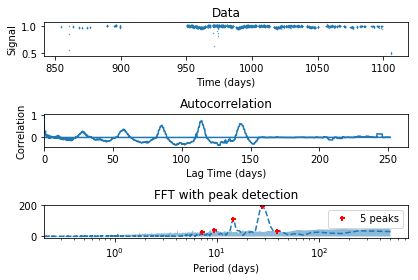

NGTS Object NG2331-3922_004392 (CYCLE1706)


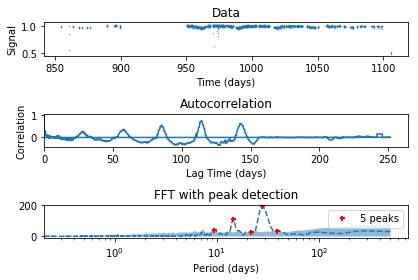

NGTS Object NG2331-3922_004399 (CYCLE1706)


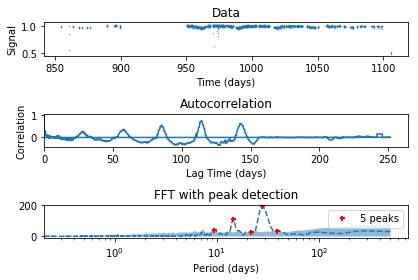

NGTS Object NG2331-3922_004322 (CYCLE1706)


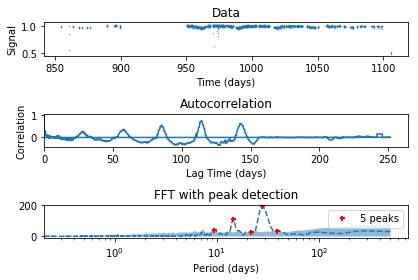

NGTS Object NG2331-3922_004329 (CYCLE1706)


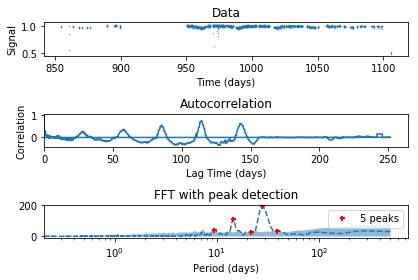

NGTS Object NG2331-3922_004408 (CYCLE1706)


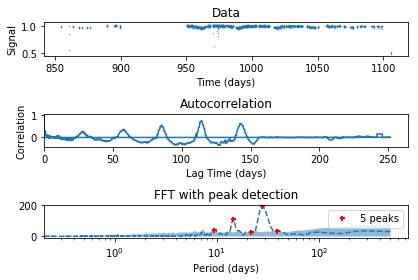

In [94]:
for obj in field[same_objs]:
    try:
        print obj
        obj.plot_data_autocol_ft(interactive=True)
    except IndexError:
            print "Not run for {}".format(obj)

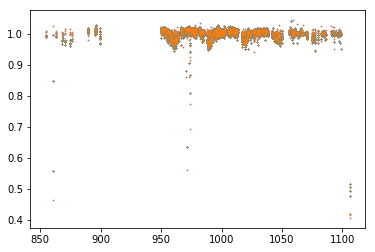

In [100]:
fig, ax = plt.subplots()
for obj in field[same_objs]:
    ax.scatter(obj.timeseries_binned, obj.flux_binned, s=0.1, label=obj.obj)
plt.show()

In [111]:
p_count = {}
for obj in field[same_objs]:
    for p in obj.periods:
        try:
            p_count[p]["Count"] += 1
#             p_count[p]["ID"].append(obj.obj)
        except KeyError:
#             p_count[p] = {"Count": 1, "ID": [obj.obj]}
            p_count[p] = {"Count": 1}
            
        

In [112]:
p_count

{7.09268815212559: {'Count': 2},
 9.501525637753149: {'Count': 18},
 14.388024537169052: {'Count': 18},
 21.89481994786595: {'Count': 16},
 27.976714377828714: {'Count': 18},
 38.73698913853206: {'Count': 18}}

In [123]:
o_count = {(obj.obj, "{0:02d}".format(i)): [round(p, 2) for p in obj.periods] for i, obj in enumerate(field[same_objs])}

In [124]:
o_count

{(u'004322', '19'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004329', '20'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004340', '12'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004347', '14'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004349', '03'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004352', '15'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004368', '02'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004370', '01'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004373', '13'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004379', '07'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004380', '10'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004383', '06'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004392', '17'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004393', '08'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004399', '18'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004408', '21'): [27.98, 14.39, 9.5, 21.89, 38.74],
 (u'004424', '16'): [27.98, 14.39, 9.5, 7.09, 38.74],
 (u'004430', '09'): [27.98, 14.39, 9.5, 7.09, 38.74],
 (u'004432',

NGTS Object NG2331-3922_004430 (CYCLE1706)


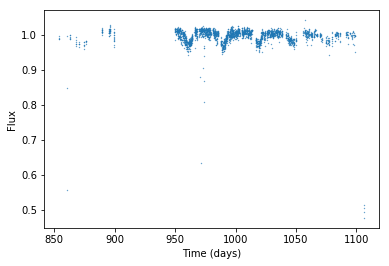

In [127]:
print field[same_objs[9]]
field[same_objs[9]].plot_data(interactive=True)

NGTS Object NG2331-3922_004408 (CYCLE1706)


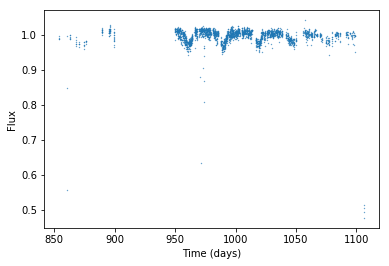

In [128]:
print field[same_objs[21]]
field[same_objs[21]].plot_data(interactive=True)

NGTS Object NG2331-3922_004432 (CYCLE1706)


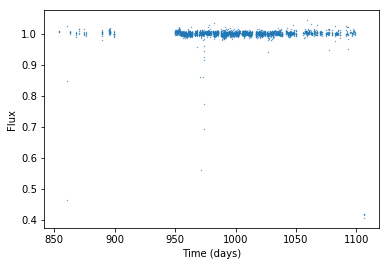

In [129]:
print field[same_objs[0]]
field[same_objs[0]].plot_data(interactive=True)

In [131]:
sys.path = ['',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python27.zip',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/plat-darwin',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/plat-mac',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/plat-mac/lib-scriptpackages',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/lib-tk',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/lib-old',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/lib-dynload',
 '/Users/joshbriegal/.local/lib/python2.7/site-packages',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/Sphinx-1.5.1-py2.7.egg',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/aeosa',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/setuptools-27.2.0-py2.7.egg',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/IPython/extensions',
 '/Users/joshbriegal/.ipython','/Users/joshbriegal/GitHub/GACF/example/', '/Users/joshbriegal/GitHub/ngtsio/']
            

In [132]:
sys.path

['',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python27.zip',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/plat-darwin',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/plat-mac',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/plat-mac/lib-scriptpackages',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/lib-tk',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/lib-old',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/lib-dynload',
 '/Users/joshbriegal/.local/lib/python2.7/site-packages',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/Sphinx-1.5.1-py2.7.egg',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/aeosa',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/setuptools-27.2.0-py2.7.egg',
 '/Users/joshbriegal/anaconda/envs/py

In [133]:
import ngtsio

In [134]:
ngtsio.get_from_server()

AttributeError: 'module' object has no attribute 'get_from_server'

In [135]:
dir(ngtsio)

['__builtins__', '__doc__', '__file__', '__name__', '__package__', '__path__']

In [136]:
sys.path = ['',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python27.zip',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/plat-darwin',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/plat-mac',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/plat-mac/lib-scriptpackages',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/lib-tk',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/lib-old',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/lib-dynload',
 '/Users/joshbriegal/.local/lib/python2.7/site-packages',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/Sphinx-1.5.1-py2.7.egg',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/aeosa',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/setuptools-27.2.0-py2.7.egg',
 '/Users/joshbriegal/anaconda/envs/python2/lib/python2.7/site-packages/IPython/extensions',
 '/Users/joshbriegal/.ipython','/Users/joshbriegal/GitHub/GACF/example/', '/Users/joshbriegal/GitHub/']

In [137]:
reload(ngtsio)

ImportError: No module named ngtsio

In [138]:
import ngtsio

In [139]:
dir(ngtsio)

['__builtins__', '__doc__', '__file__', '__name__', '__package__', '__path__']

In [140]:
from ngtsio import ngtsio

In [141]:
dir(ngtsio)

['FastTransport',
 'SERVER_PYTHON_EXEC_STRING',
 'SFTP',
 'SSHClient',
 'Transport',
 'UnixException',
 'WarningPolicy',
 '__builtins__',
 '__doc__',
 '__file__',
 '__name__',
 '__package__',
 '__version__',
 'find',
 'find_list',
 'get',
 'get_from_ssh',
 'get_on_server',
 'getpass',
 'ngtsio_find',
 'ngtsio_get',
 'np',
 'os',
 'pickle',
 'save',
 'warnings']

In [144]:
same_obj_ids = [o.obj for o in field[same_objs]]
same_obj_ids

[u'004432',
 u'004370',
 u'004368',
 u'004349',
 u'004433',
 u'004443',
 u'004383',
 u'004379',
 u'004393',
 u'004430',
 u'004380',
 u'004440',
 u'004340',
 u'004373',
 u'004347',
 u'004352',
 u'004424',
 u'004392',
 u'004399',
 u'004322',
 u'004329',
 u'004408']

In [146]:
help(ngtsio.get)

Help on function get in module ngtsio.ngtsio:

get(fieldname, ngts_version, keys, obj_id=None, obj_row=None, time_index=None, time_date=None, time_hjd=None, time_actionid=None, bls_rank=1, indexing='fits', fitsreader='fitsio', simplify=True, fnames=None, root=None, roots=None, silent=False, set_nan=False)
    get data for a given object with ngtsio_get.py; see ngtsio_get.py for docstring



In [151]:
dic = ngtsio.get_on_server(fieldname=field.fieldname, ngts_version=field.test, obj_id=same_obj_ids, 
                           keys=['OBJ_ID', "CCD_X", "CCD_Y", "FLUX_MEAN"])

Enter hostname: appcg.ra.phy.cam.ac.uk
Enter username for host appcg.ra.phy.cam.ac.uk: jtb34
········
Field name: NG2331-3922
NGTS version: CYCLE1706
Object IDs ( 22 ): ['004322' '004329' '004340' '004347' '004349' '004352' '004368' '004370'
 '004373' '004379' '004380' '004383' '004392' '004393' '004399' '004408'
 '004424' '004430' '004432' '004433' '004440' '004443']
###############################################################################
Success: All keys successfully read into dictionary.
###############################################################################



In [152]:
dic

{'CCD_X': array([ 102.03796, 1620.2194 , 1764.501  ,  531.47595,  182.32787,
        1959.1222 ,  235.62685, 1169.2631 , 1172.6737 , 1055.1382 ,
        1215.8945 ,  886.0022 ,  827.24524, 1269.158  ,  848.156  ,
         361.0428 ,  786.7006 ,  837.2197 ,  257.38712,  263.877  ,
        1900.128  , 1175.1705 ], dtype=float32),
 'CCD_Y': array([326.8201 , 327.0297 , 328.75803, 328.46066, 328.52444, 328.72055,
        331.42978, 331.80084, 328.75418, 332.239  , 315.03564, 331.9123 ,
        332.76044, 331.00684, 332.3252 , 333.6861 , 334.7828 , 335.875  ,
        325.87027, 336.08676, 336.32397, 336.37756], dtype=float32),
 'FIELDNAME': u'NG2331-3922',
 'FLUX_MEAN': array([  114.29036 ,   234.98956 ,    66.580124,   221.12762 ,
          178.51068 ,   275.01364 ,   101.73554 ,    62.74512 ,
           85.82238 ,    64.68803 , 10638.549   ,   227.46135 ,
          142.19394 ,  1713.5602  ,   466.8808  ,   138.06143 ,
          175.05698 ,    99.29134 ,  7016.3496  ,   136.17978 ,
       

In [156]:
import matplotlib as mpl

In [300]:
fig, ax = plt.subplots()
c_min = min(dic['FLUX_MEAN'])
c_max= max(dic['FLUX_MEAN'])
cmap = mpl.cm.viridis
axc = fig.add_axes([0.95, 0.1, 0.01, 0.8])
norm = mpl.colors.LogNorm(vmin=c_min, vmax=c_max)
cb = mpl.colorbar.ColorbarBase(axc, norm=norm, cmap=cmap, orientation='vertical')
cb.set_clim(vmin=c_min, vmax=c_max)
cb.set_label("MEAN FLUX")
ax.scatter(dic['CCD_X'], dic['CCD_Y'], c=dic["FLUX_MEAN"], cmap=cmap, norm=norm)
ax.set_xlabel("CCD X")
ax.set_ylabel("CCD Y")
# ax.set_facecolor('pink')
ax.set_xlim(0, 2048)
ax.set_ylim(0, 2048)
plt.show()

In [198]:
all_ccd_flux = ngtsio.get_on_server(fieldname=field.fieldname, ngts_version=field.test, obj_id=field.object_list, 
                           keys=['OBJ_ID', "CCD_X", "CCD_Y", "FLUX_MEAN"])

Enter hostname: appcg.ra.phy.cam.ac.uk
Enter username for host appcg.ra.phy.cam.ac.uk: jtb34
········
Field name: NG2331-3922
NGTS version: CYCLE1706
Object IDs ( 3433 ): ['000219' '000251' '000310' ... '024793' '024796' '024806']
###############################################################################
Success: All keys successfully read into dictionary.
###############################################################################



In [ ]:
def plot_objects_vs_period(self, calculate=False, signal_to_noise=False, fig_ax_tuple=None,
                           save_if_true_else_return=True, interactive=False):
    if calculate:
        self.calculate_periods_from_autocorrelation(calculate_noise=signal_to_noise)
    if fig_ax_tuple is None:
        fig, (ax, ax1, ax2) = plt.subplots(3, 1, figsize=(12, 8))
    else:
        fig, ax = fig_ax_tuple

#     max_signal_to_noise = max([max(obj.peak_signal_to_noise) for obj in self if np.array(obj.peak_signal_to_noise).size > 0])
#     min_signal_to_noise = min([min(obj.peak_signal_to_noise) for obj in self if np.array(obj.peak_signal_to_noise).size > 0])
    min_obj_id = np.inf
    max_obj_id = 0
    cmap = mpl.cm.viridis

    if fig_ax_tuple is None:
        c_min = 1
        c_max = 2  # max_signal_to_noise
        axc = fig.add_axes([0.95, 0.1, 0.01, 0.8])
        norm = mpl.colors.Normalize(vmin=c_min, vmax=c_max)
        cb = mpl.colorbar.ColorbarBase(axc, norm=norm, cmap=cmap, orientation='vertical')
        cb.set_clim(vmin=c_min, vmax=c_max)
        cb.set_label("Signal to Noise")
        
    duration = 251.8615856329
    freq_diff = (1 / duration) / 2
    start_freq = 0.0456729155
    start_freq2 = 0.03472159
    precision = 5e-5

    for i, obj in enumerate(self):
        periods = np.divide(1.0, obj.period s)
        color = obj.peak_signal_to_noise
        # prune periods which are aliases
#         if i%100 == 0:
#             for p in periods:
#                 a = abs((p-start_freq)) % freq_diff
#                 print "{:.2e} ({:.2e}) => {}".format(a, precision, a<precision)
#                 old_len = len(periods)
# #                 print "len periods {}".format(len(periods))
#         periodss = [(p,c) for p,c in zip(periods, color) if abs((p-start_freq)) % freq_diff > precision]
#         periods = [p[0] for p in periodss]
#         if i%100 == 0:
#             print "len periods {}->{}".format(old_len, len(periods))
#         color = [p[1] for p in periodss]
        

        obj_id = int(obj.obj)
        ccd_x = obj.ccd_x
        ccd_y = obj.ccd_y
        if obj_id > max_obj_id:
            max_obj_id = obj_id
        elif obj_id < min_obj_id:
            min_obj_id = obj_id

        if np.array(color).size > 0:
            size = np.interp(color, (c_min, c_max), (0.1, 2))
        else:
            size = color
        y = np.linspace(obj_id, obj_id, len(periods))
        y1 = np.linspace(ccd_x, ccd_y, len(periods))
        y2 = np.linspace(ccd_y, ccd_y, len(periods))        
        # ax.scatter(periods, y, s=size, c='k')
        ax.scatter(1/periods, y, c=color, cmap=cmap, s=size, norm=norm)
        ax1.scatter(1/periods, y1, c=color, cmap=cmap, s=size, norm=norm)
        ax2.scatter(1/periods, y2, c=color, cmap=cmap, s=size, norm=norm)

    if fig_ax_tuple is None:
#         ax.set_ylabel('Object no.')
        ax.set_ylabel("Object ID")
        ax1.set_ylabel("X CCD Position")
        ax2.set_ylabel("Y CCD Position")
        for a in (ax, ax1, ax2):
            a.set_xlabel('Frequency (1/days)')
        #         ax.set_xscale('log')
            a.xaxis.grid(True, linestyle='--', alpha=0.5, which='both', lw=1)
        #         ax.set_xlim(left=0)
        ax.set_ylim([min_obj_id*0.8, max_obj_id + (min_obj_id*0.2)])
        ax1.set_ylim(0, 2048)
        ax2.set_ylim
        fig.suptitle('Objects in Field {} and GACF periods'.format(self.fieldname))
#         fig.tight_layout()
        # ax.set_yticks(np.linspace(0, self.num_objects - 1, self.num_objects))
        # ax.set_yticklabels(['obj_id {}'.format(obj.obj) for obj in self], fontdict={'fontsize': 6})



        # ax.set_facecolor('lightgray')

        # ax.set_yticks(np.append(ax.get_yticks(), np.linspace(0, self.num_objects - 1, self.num_objects)))
        # ax.set_yticklabels(np.append(ax.get_yticklabels()[1], ['obj_id {}'.format(obj.obj) for obj in self]),
                           # fontdict={'fontsize': 6})
#         duration = field[0].timeseries_binned[-1] - field[0].timeseries_binned[0]

#         for a in (ax, ax1, ax2):
#             for i in xrange(1000):
#                 upper_freq = start_freq2 + (freq_diff * i)
#                 lower_freq = start_freq2 - (freq_diff * i)
#                 if lower_freq > 0.:
#                     a.axvline(x=lower_freq, c='b', lw=0.5)
#                 if upper_freq < 1.:
#                     a.axvline(x=upper_freq, c='b', lw=0.5)
# #             ax.axvline(x=start_freq2 + (freq_diff * i), c='b', lw=0.5)
# #             ax.axvline(x=start_freq2 - (freq_diff * i), c='b', lw=0.5)
            

    if save_if_true_else_return:
        if interactive:
            plt.show()
        else:
            fig.savefig(os.path.join(self.filename, 'Objects vs Period.png'))
            plt.close(fig)
            return
    else:
        return fig, ax

In [204]:
for obj in field:
    for i, o in enumerate(all_ccd_flux['OBJ_ID']):
        if int(obj.obj) == int(o):
            obj.ccd_y = all_ccd_flux['CCD_Y'][i]
            obj.ccd_x = all_ccd_flux['CCD_X'][i]
            obj.mean_flux = all_ccd_flux['FLUX_MEAN'][i]
            

In [334]:
plot_objects_vs_period(field, interactive=True)

%matplotlib
plt.ion()

In [224]:
duration = field[0].timeseries_binned[-1] - field[0].timeseries_binned[0]

In [225]:
freq_diff = 1 / duration

In [227]:
freq_diff / 2

0.001986581267384992

In [246]:
duration

251.68867149249218

In [301]:
same_obj_ids

[u'004432',
 u'004370',
 u'004368',
 u'004349',
 u'004433',
 u'004443',
 u'004383',
 u'004379',
 u'004393',
 u'004430',
 u'004380',
 u'004440',
 u'004340',
 u'004373',
 u'004347',
 u'004352',
 u'004424',
 u'004392',
 u'004399',
 u'004322',
 u'004329',
 u'004408']

In [303]:
import paramiko
import getpass

In [306]:
ssh_client = paramiko.SSHClient()
hostname = "appcs.ra.phy.cam.ac.uk"
username = "jtb34"
password = getpass.getpass()
ssh_client.load_system_host_keys()
ssh_client.set_missing_host_key_policy(paramiko.WarningPolicy)
ssh_client.connect(hostname, username=username, password=password)

········


In [307]:
new_data = ngtsio.get_on_server(fieldname=field.fieldname, ngts_version=field.test, obj_id=same_obj_ids, 
                           keys=['OBJ_ID', "CCD_X", "CCD_Y", "FLUX_MEAN", "SYSREM_FLUX3", 'HJD', "FLAGS"], 
                                ssh_client=ssh_client)

Field name: NG2331-3922
NGTS version: CYCLE1706
Object IDs ( 22 ): ['004322' '004329' '004340' '004347' '004349' '004352' '004368' '004370'
 '004373' '004379' '004380' '004383' '004392' '004393' '004399' '004408'
 '004424' '004430' '004432' '004433' '004440' '004443']
###############################################################################
Success: All keys successfully read into dictionary.
###############################################################################



In [310]:
len(new_data['SYSREM_FLUX3'][0])

216524

In [313]:
field2 = Field(fieldname=field.fieldname, object_list=same_obj_ids)

In [316]:
field2.initialise_objects()

In [317]:
field2.objects

[NGTS Object NG2331-3922_004432 (CYCLE1706),
 NGTS Object NG2331-3922_004370 (CYCLE1706),
 NGTS Object NG2331-3922_004368 (CYCLE1706),
 NGTS Object NG2331-3922_004349 (CYCLE1706),
 NGTS Object NG2331-3922_004433 (CYCLE1706),
 NGTS Object NG2331-3922_004443 (CYCLE1706),
 NGTS Object NG2331-3922_004383 (CYCLE1706),
 NGTS Object NG2331-3922_004379 (CYCLE1706),
 NGTS Object NG2331-3922_004393 (CYCLE1706),
 NGTS Object NG2331-3922_004430 (CYCLE1706),
 NGTS Object NG2331-3922_004380 (CYCLE1706),
 NGTS Object NG2331-3922_004440 (CYCLE1706),
 NGTS Object NG2331-3922_004340 (CYCLE1706),
 NGTS Object NG2331-3922_004373 (CYCLE1706),
 NGTS Object NG2331-3922_004347 (CYCLE1706),
 NGTS Object NG2331-3922_004352 (CYCLE1706),
 NGTS Object NG2331-3922_004424 (CYCLE1706),
 NGTS Object NG2331-3922_004392 (CYCLE1706),
 NGTS Object NG2331-3922_004399 (CYCLE1706),
 NGTS Object NG2331-3922_004322 (CYCLE1706),
 NGTS Object NG2331-3922_004329 (CYCLE1706),
 NGTS Object NG2331-3922_004408 (CYCLE1706)]

In [324]:
for obj in tqdm(field2):
    obj.obj = str(obj.obj)
    obj.get_data_from_dict(new_data)

0it [00:00, ?it/s]


In [330]:
field2[0]

NGTS Object NG2331-3922_004432 (CYCLE1706)

In [332]:
new_data['OBJ_ID']

array(['004322', '004329', '004340', '004347', '004349', '004352',
       '004368', '004370', '004373', '004379', '004380', '004383',
       '004392', '004393', '004399', '004408', '004424', '004430',
       '004432', '004433', '004440', '004443'], dtype='|S6')

In [344]:
obj_data = {}
for obj in field2:
    obj_idx = np.where(new_data["OBJ_ID"] == obj)
    obj_data[obj.obj] = {}
    for key in new_data.keys():
        try:
            obj_data[obj.obj][key] = new_data[key][obj_idx]
        except TypeError:
            print key
obj_data

{}

In [338]:
new_data.keys()

['SYSREM_FLUX3',
 'OBJ_ID',
 'CCD_X',
 'CCD_Y',
 'HJD',
 'FLUX_MEAN',
 'NGTS_VERSION',
 'FLAGS',
 'FIELDNAME']

In [350]:
fig, ax = plt.subplots()
for i, _ in enumerate(new_data['OBJ_ID']):
    ax.scatter(new_data['HJD'][i], new_data['SYSREM_FLUX3'][i] / new_data['FLUX_MEAN'][i], s=0.1)
plt.show()